Preprocessing Pipeline
Denosing with Adaptive Filter

In [1]:
from eeg_helper import *
import params as cfg

In [2]:
"Laurel Place Dataset"
localPath = '/Users/joshuaighalo/Library/CloudStorage/OneDrive-SimonFraserUniversity(1sfu)/workspace/datasets/raw-eeg/laurel_place/cleaned_dataset'
img_save_path = '/Users/joshuaighalo/Documents/BrainNet/Projects/Workspace/results/laurel place/images/single_averages/2.0'
filename = '0406_1_15042019_1047'
#filename = '0011_2_22022019_1405'
version = 1.0
image_name = "Dementia Scan"
cutoff = 10

In [3]:
"Bruyere Dataset"
#version = 1.1
#filename = '3-24-16-29-14-cn_2_04022019_1526'
#localPath = '/Users/joshuaighalo/Downloads/brainNet_datasets/bruyere'

'Bruyere Dataset'

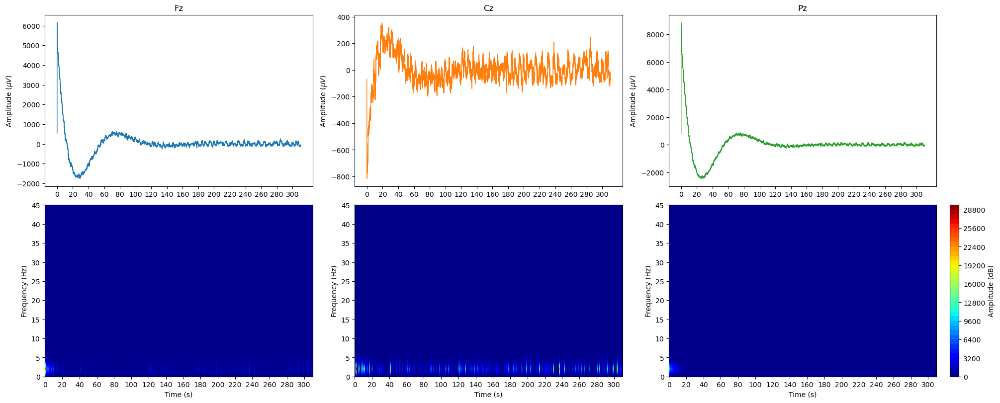

In [4]:
device = importFile.neurocatch()
fileObjects = device.init(version,filename,localPath,dispIMG=False)
rawEEG = fileObjects[0]
rawEOG = fileObjects[1]
rawEEGEOG = fileObjects[2]
time = fileObjects[3]
trigOutput = fileObjects[4]

plotter = visualizations() 
args = {'fs':cfg.fs,'figsize':(20,8),'subTitles':['Fz','Cz','Pz'],'xlim':[time[0],time[-1]]}
plotter.spectrogram(time,rawEEG,**args)

# combine rawEEG and rawEOG and trigOutput
test = np.concatenate((rawEEG,rawEOG),axis=1)
test = np.column_stack((test,trigOutput.T))
# save test as npy file
np.save('lp_test.npy',test)
# export trigOutput to csv
#np.savetxt('trigOutput.csv', trigOutput, delimiter=',', fmt='%d')


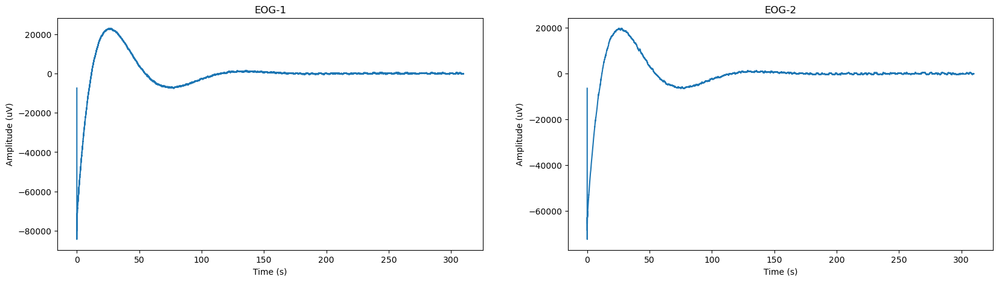

In [5]:
fig,ax = plt.subplots(1,2,figsize=(20,5))
ax[0].plot(time,rawEOG[:,0])
ax[0].set_title('EOG-1')
ax[0].set_xlabel('Time (s)')
ax[0].set_ylabel('Amplitude (uV)')
ax[1].plot(time,rawEOG[:,1])
ax[1].set_title('EOG-2')
ax[1].set_xlabel('Time (s)')
ax[1].set_ylabel('Amplitude (uV)')
plt.show()

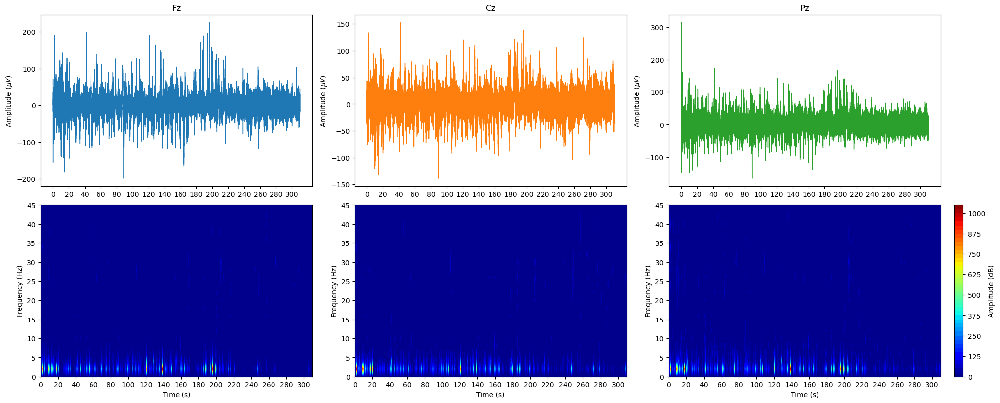

In [6]:
filtering = filters()
adaptiveFilterOutput = filtering.adaptive(rawEEG,rawEOG)
args = {'fs':cfg.fs,'figsize':(20,8),'subTitles':['Fz','Cz','Pz'],'xlim':[time[0],time[-1]]}
plotter.spectrogram(time,adaptiveFilterOutput,**args)

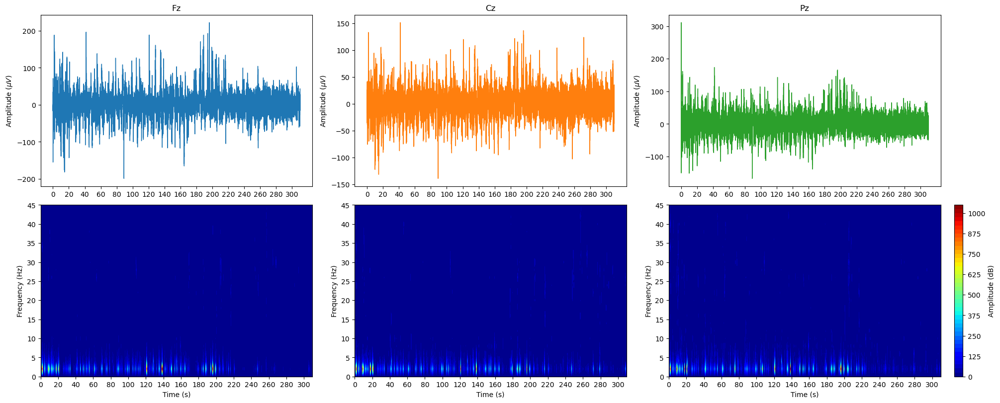

In [7]:
filtering = filters()
notchFilterOutput = filtering.notch(adaptiveFilterOutput,line,fs)
args = {'fs':cfg.fs,'figsize':(20,8),'subTitles':['Fz','Cz','Pz'],'xlim':[time[0],time[-1]]}
plotter.spectrogram(time,notchFilterOutput,**args)

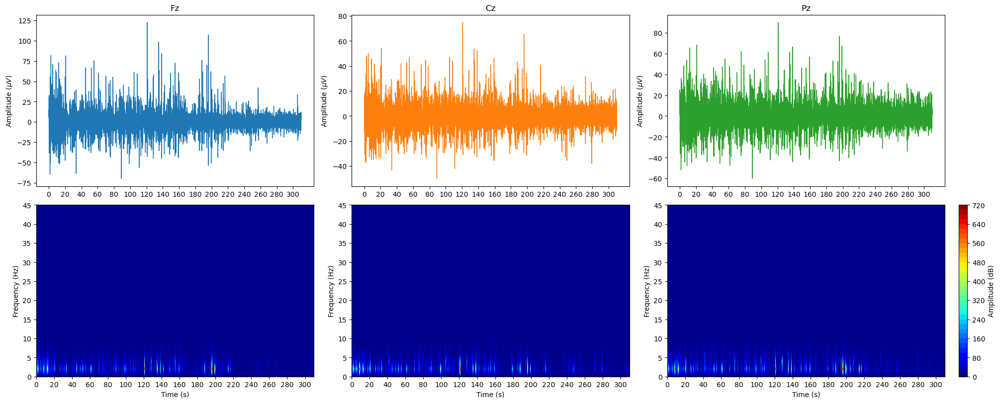

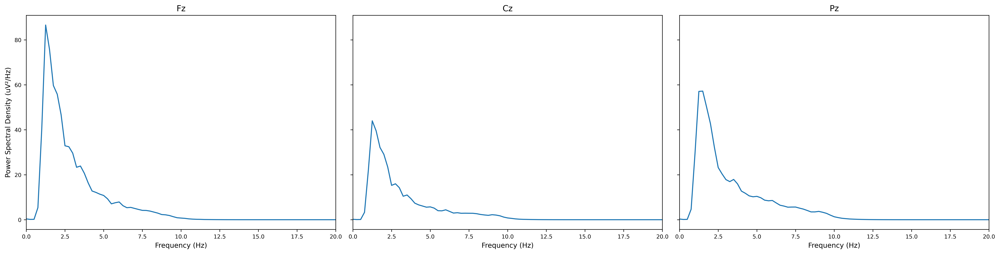

In [8]:
bandPassFilterOutput = filtering.butterBandPass(notchFilterOutput,lowcut=1,highcut=10,fs=cfg.fs)
args = {'fs':cfg.fs,'figsize':(20,8),'subTitles':['Fz','Cz','Pz'],'xlim':[time[0],time[-1]]}
plotter.spectrogram(time,bandPassFilterOutput,**args)
args = {'fs':cfg.fs,'win':4*cfg.fs,'plot_title':cfg.channelNames,'xlim':[0,20],'figsize':[20,5]}
plotter.PSD(bandPassFilterOutput,**args)

In [9]:
args = {'scanID':filename,'chanNames':cfg.channelNames,'stimTrig':cfg.stimTrig,'clip':cfg.clip,'lowpass':cfg.lowPass,'fs':cfg.fs,'dispIMG':False}
erps = erpExtraction()
N1P3 = erps.N100P300(eegData=bandPassFilterOutput,
                    trigger_channel=trigOutput,
                    period=time,
                    **args)
N4 = erps.N400(eegData=bandPassFilterOutput,
                period=time,
                trigger_channel=trigOutput,
                **args)
latency = N1P3[2]

In [10]:
args_1 = {'titles':cfg.channelNames,'N1P3':True}
args_2 = {'titles':cfg.channelNames,'N4':True}
plotter.ERPs(N1P3[0],latency,**args_1)
plotter.ERPs(N4[0],latency,**args_2)

In [11]:
std_Fz,dev_Fz,std_Cz,dev_Cz,std_Pz,dev_Pz = N1P3[0][0],N1P3[0][1],N1P3[0][2],N1P3[0][3],N1P3[0][4],N1P3[0][5]
con_Fz,inc_Fz,con_Cz,inc_Cz,con_Pz,inc_Pz = N4[0][0],N4[0][1],N4[0][2],N4[0][3],N4[0][4],N4[0][5]
std_Fz,dev_Fz,std_Cz,dev_Cz,std_Pz,dev_Pz = std_Fz[50:],dev_Fz[50:],std_Cz[50:],dev_Cz[50:],std_Pz[50:],dev_Pz[50:]
con_Fz,inc_Fz,con_Cz,inc_Cz,con_Pz,inc_Pz = con_Fz[50:],inc_Fz[50:],con_Cz[50:],inc_Cz[50:],con_Pz[50:],inc_Pz[50:]
latency = latency[50:]

In [12]:
epochs_std_Fz,epochs_dev_Fz,epochs_std_Cz,epochs_dev_Cz,epochs_std_Pz,epochs_dev_Pz = N1P3[1][0],N1P3[1][1],N1P3[1][2],N1P3[1][3],N1P3[1][4],N1P3[1][5]
epochs_con_Fz,epochs_inc_Fz,epochs_con_Cz,epochs_inc_Cz,epochs_con_Pz,epochs_inc_Pz = N4[1][0],N4[1][1],N4[1][2],N4[1][3],N4[1][4],N4[1][5]
epochs_std_Fz,epochs_dev_Fz,epochs_std_Cz,epochs_dev_Cz,epochs_std_Pz,epochs_dev_Pz = epochs_std_Fz[:,50:],epochs_dev_Fz[:,50:],epochs_std_Cz[:,50:],epochs_dev_Cz[:,50:],epochs_std_Pz[:,50:],epochs_dev_Pz[:,50:]
epochs_con_Fz,epochs_inc_Fz,epochs_con_Cz,epochs_inc_Cz,epochs_con_Pz,epochs_inc_Pz = epochs_con_Fz[:,50:],epochs_inc_Fz[:,50:],epochs_con_Cz[:,50:],epochs_inc_Cz[:,50:],epochs_con_Pz[:,50:],epochs_inc_Pz[:,50:]

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Example data
#x = np.linspace(0, 10, 1000)
#y = 2 + np.sin(x)
x = np.linspace(0, 10, 1000)
y = np.sin(x**2)
def downwards_peaks(x,y):
    peak_indices = [i for i in range(1, len(y) - 1) if y[i - 1] > y[i] and y[i] < y[i + 1]]
    return peak_indices

def downwards_peaks_ext(timing_array,erp_array,prominence=10):
    neg_peak_indices, _ = find_peaks(-erp_array, prominence=prominence)
    if len(neg_peak_indices) == 0:
        neg_peak_indices = downwards_peaks(timing_array, erp_array)
    peak_amplitudes = erp_array[neg_peak_indices]
    peak_times = timing_array[neg_peak_indices]
    return peak_times, peak_amplitudes

# indices for N100, P300, N400 i.e., 80-300ms, 300-600ms, 300-900ms
n100_lat_idx, p300_lat_idx, n400_lat_idx = [40,149],[150,299],[150,447]
n100_lat, p300_lat, n400_lat = latency[n100_lat_idx[0]:n100_lat_idx[1]],latency[p300_lat_idx[0]:p300_lat_idx[1]],latency[n400_lat_idx[0]:n400_lat_idx[1]]
n100_amp_Fz,n100_amp_Cz,n100_amp_Pz = dev_Fz[n100_lat_idx[0]:n100_lat_idx[1]],dev_Cz[n100_lat_idx[0]:n100_lat_idx[1]],dev_Pz[n100_lat_idx[0]:n100_lat_idx[1]]
p300_amp_Fz,p300_amp_Cz,p300_amp_Pz = dev_Fz[p300_lat_idx[0]:p300_lat_idx[1]],dev_Cz[p300_lat_idx[0]:p300_lat_idx[1]],dev_Pz[p300_lat_idx[0]:p300_lat_idx[1]]
n400_amp_Fz,n400_amp_Cz,n400_amp_Pz = inc_Fz[n400_lat_idx[0]:n400_lat_idx[1]],inc_Cz[n400_lat_idx[0]:n400_lat_idx[1]],inc_Pz[n400_lat_idx[0]:n400_lat_idx[1]]

In [14]:
winN100AmpFZ,winN100Lat = slidingWindow(n100_amp_Fz,5,5),slidingWindow(n100_lat,5,5)
winN100AmpCZ = slidingWindow(n100_amp_Cz,5,5)
winN100AmpPZ = slidingWindow(n100_amp_Pz,5,5)
winP300AmpFZ,winP300Lat = slidingWindow(p300_amp_Fz,5,5),slidingWindow(p300_lat,5,5)
winP300AmpCZ = slidingWindow(p300_amp_Cz,5,5)
winP300AmpPZ = slidingWindow(p300_amp_Pz,5,5)
winN400AmpFZ,winN400Lat = slidingWindow(n400_amp_Fz,5,5),slidingWindow(n400_lat,5,5)
winN400AmpCZ = slidingWindow(n400_amp_Cz,5,5)
winN400AmpPZ = slidingWindow(n400_amp_Pz,5,5)

In [15]:
# pfunction that genrate p-values using paired t-test comparison between the each row of the two input arrays
def paired_ttest_pvalues(array1,array2):
    from scipy.stats import ttest_rel
    pvalues = []
    for i in range(len(array1)):
        pvalues.append(ttest_rel(array1[i],array2[i])[1])
        print('p-value for row {} is {}'.format(i,pvalues[i]))
    return pvalues

pvalN100 = paired_ttest_pvalues(winN100AmpFZ,winN100AmpCZ)
pvalN400 = paired_ttest_pvalues(winN400AmpPZ,winN400AmpCZ)

p-value for row 0 is 2.1090594058396506e-08
p-value for row 1 is 1.9789757329227697e-08
p-value for row 2 is 2.5512000848909428e-09
p-value for row 3 is 4.891815572789924e-11
p-value for row 4 is 3.937611975361102e-08
p-value for row 5 is 3.598628877993818e-07
p-value for row 6 is 8.914973543623049e-07
p-value for row 7 is 1.0318372121506297e-06
p-value for row 8 is 6.61064005150134e-07
p-value for row 9 is 2.217265522815093e-07
p-value for row 10 is 2.31398959443822e-08
p-value for row 11 is 8.240149914047208e-12
p-value for row 12 is 2.33188294183189e-08
p-value for row 13 is 5.354288087396674e-07
p-value for row 14 is 3.574547781938372e-06
p-value for row 15 is 1.4508437578094106e-05
p-value for row 16 is 4.4046164261640834e-05
p-value for row 17 is 0.00010309699859779577
p-value for row 18 is 0.0001575757701159041
p-value for row 19 is 8.27282321419472e-05
p-value for row 20 is 1.8006683062685783e-06
p-value for row 0 is 4.746615022973919e-07
p-value for row 1 is 1.0823054411812119